In [1]:
import os
from PIL import Image
from pathlib import Path
import numpy as np
import seaborn as sns
from tqdm import tqdm
from matplotlib import pyplot as plt
import pickle
from collections import Counter
from seaborn import barplot

In [2]:
# main_dir = Path('/home/ibukey/ttmp/primus-awdlstm')
# primus_directory = main_dir / 'primus-small'
main_dir = Path('/home/ibukey/ttmp/')
primus_directory = main_dir / 'primus-leipzig-txt'
outdir = Path('/home/ibukey/ttmp/primus-tokenized_2')
# outdir = Path('/home/ibukey/ttmp/primus-leipzig-small-tokenized')

In [3]:
# empty_staff = "00000000001110000000000000001110000000000000001110000000000000001110000000000000001110000000000"
empty_staff = "0000000000000000000000000000000000000000000000000011100000000000000011100000000000000011100000000000000011100000000000000011100000000000000000000000000000000000000000000000000"
small_staff = '0' * 40 + "00000000000100000000000000000100000000000000000100000000000000000100000000000000000100000000000" + '0' * 40
shifted_staff = '0' * 40 + "00000000000000000000011100000000000000011100000000000000011100000000000000011100000000000000011" + '0' * 40
empty = '0' * 40 + "00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000" + '0' * 40

In [4]:
img_directory  = os.listdir(primus_directory)
img_directory = [img for img in img_directory if img[-3:]=="txt"]

In [5]:
len(img_directory)

29153

In [6]:
for img in tqdm(img_directory):
    with open(primus_directory / img) as file:
        words = file.read().split()
        fout = open(outdir / img, "w")
        for word in words:
            if word == empty_staff or word==small_staff or word==empty or word==shifted_staff:
                fout.write(' ')
            else:
                fout.write(word)
        fout.close()

100%|███████████████████████████████████| 29153/29153 [00:24<00:00, 1173.79it/s]


In [11]:
width_freqs = {}
word_freqs = {}
for img in tqdm(os.listdir(outdir)):
    with open(outdir / img) as file:
        text = file.read()
        curr_width = 0
        curr_word = ""
        for char in text:
            if char != ' ':
                curr_word += char
                if curr_width > 0:
                   # increase curr_width freq in width_freqs
                    if curr_width in width_freqs.keys():
                        width_freqs[curr_width] += 1
                    else:
                         width_freqs[curr_width] = 1
                curr_width = 0
            else:
                curr_width += 1
                
                if curr_width > 6:
                    if curr_word != "":
                        # increase curr_word freq in word_freqs
                        if curr_word in word_freqs.keys():
                            word_freqs[curr_word] += 1
                        else:
                            word_freqs[curr_word] = 1
                    curr_word = ""
                else:
                    curr_word += empty_staff

100%|█████████████████████████████████████████| 100/100 [00:02<00:00, 39.33it/s]


In [12]:
# word_freqs

In [7]:
def wordToImg(word):
    """
    Convert given word to image
    """
    word_arr = np.reshape(np.array([1 if int(char)==0 else 0 for char in word]),
                                  (len(word)//175, 175)).transpose()
    im = Image.fromarray((word_arr * 255).astype(np.uint8))
    im.show()
    return im

In [1]:
word_freqs_lst = [(key, word_freqs[key]) for key in word_freqs.keys()]
word_freqs_lst.sort(key=lambda x:x[1], reverse=True)


# most frequent words
for i in range(100):
    img = wordToImg(word_freqs_lst[i][0])
#     img.save(f'/home/ibukey/primus/common_words/{i}.png')
#     img.save(f'/home/ibukey/primus/least_common_words/{i}.png')


In [2]:
wordToImg(word_freqs_lst[2][0]).save('cclef-6.png')
wordToImg(word_freqs_lst[99][0]).save('dotted-6.png')
wordToImg(word_freqs_lst[7][0]).save('quarter-6.png')
wordToImg(word_freqs_lst[72][0]).save('twosharps-6.png')

In [12]:
for key in width_freqs:
    if key > 800:
        print(key, width_freqs[key])

833 1


In [44]:
word_freqs

{'00000000000000000000000000000000000000000000000000111000000000000000111000000000000000111111111111111111111111111111111111111111111111111111111111111111111111100000000000000000000000000000000000000000000000000000000000000000011100000000000000011100000000000000011111111111111111111111111111111111111111111111111111111111111111111111110000000000000000000000000000000000000000000000000000000000000000001110000000000000001110000000000000001111111111111111111111111111111111111111111111111111111111111111111111111000000000000000000000000000000000000000000000000000000000000000000111000000000000000111000000000000000111111111111111111111111111111111111111111111111111111111111111111111111100000000000000000000000000000000000000000000000000000000000000000011100000000000000011100000000000000011111111111111111111111111111111111111111111111111111111111111111111111110000000000000000000000000000000000000000000000000000000000000000001110000000000000001110000000000000001111111111111111111111111111111111111

In [24]:
len(word_freqs)

57295

In [45]:
width_freqs

{10: 29447,
 4: 30464,
 18: 83634,
 17: 50074,
 27: 12572,
 40: 2038,
 7: 5817,
 56: 16064,
 82: 9039,
 41: 3497,
 6: 13566,
 57: 4136,
 46: 39801,
 22: 40021,
 32: 21633,
 9: 29055,
 15: 2781,
 29: 4156,
 14: 7522,
 26: 9130,
 2: 9205,
 144: 1062,
 5: 23768,
 53: 5737,
 8: 12264,
 1: 5065,
 92: 4849,
 13: 2620,
 11: 597,
 3: 6419,
 48: 5891,
 93: 1869,
 98: 1396,
 55: 1257,
 143: 222,
 52: 6616,
 33: 5810,
 23: 10265,
 34: 2386,
 77: 1247,
 42: 1796,
 19: 4868,
 24: 10954,
 20: 3882,
 25: 2798,
 37: 1750,
 84: 727,
 47: 7177,
 58: 4581,
 101: 496,
 54: 1161,
 60: 1415,
 35: 1576,
 51: 3723,
 83: 3070,
 49: 3148,
 62: 2048,
 109: 661,
 30: 2194,
 96: 463,
 150: 132,
 164: 81,
 21: 4476,
 115: 140,
 59: 1469,
 50: 2259,
 71: 1123,
 88: 372,
 31: 2238,
 45: 2151,
 16: 1597,
 63: 1597,
 131: 189,
 38: 1606,
 12: 2498,
 43: 1510,
 28: 2158,
 99: 1192,
 79: 780,
 78: 563,
 73: 912,
 94: 658,
 64: 1065,
 166: 104,
 134: 472,
 36: 1338,
 44: 512,
 133: 311,
 95: 531,
 81: 1078,
 72: 885,
 76:

In [46]:
with open('word_freqs.pickle', 'wb') as f:
    pickle.dump(word_freqs, f)

In [47]:
with open('width_freqs.pickle', 'wb') as f:
    pickle.dump(width_freqs, f)

In [7]:
with open('word_freqs.pickle', "rb") as f:
    word_freqs = pickle.load(f)

In [10]:
with open('width_freqs.pickle', "rb") as f:
    width_freqs = pickle.load(f)

In [8]:
len(word_freqs)

52830

In [25]:
with open('word_freqs_6.pickle', 'wb') as f:
    pickle.dump(word_freqs, f)

In [5]:
with open('word_freqs_6.pickle', "rb") as f:
    word_freqs = pickle.load(f)

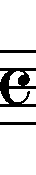

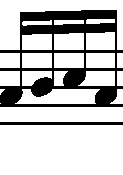

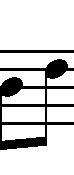

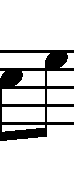

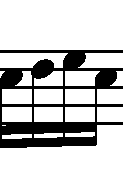

...

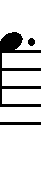

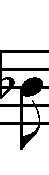

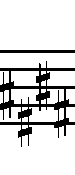

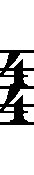

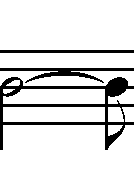

In [12]:
word_freqs_lst = [(key, word_freqs[key]) for key in word_freqs.keys()]
# word_freqs_lst.sort(key=lambda x:x[1], reverse=True)
# print(word_freqs_lst)

# most frequent words
for i in range(240, 400):
    img = wordToImg(word_freqs_lst[i][0])
#     img.save(f'/home/ibukey/primus/common_words/{i}.png')
#     img.save(f'/home/ibukey/primus/least_common_words/{i}.png')


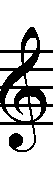

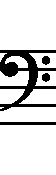

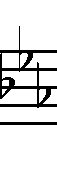

In [28]:
wordToImg(word_freqs_lst[1][0]).save('bar-6.png')
wordToImg(word_freqs_lst[2][0]).save('gclef-6.png')
wordToImg(word_freqs_lst[3][0]).save('rest-6.png')
wordToImg(word_freqs_lst[67][0]).save('bassclef-6.png')
wordToImg(word_freqs_lst[91][0]).save('threeflats-6.png')

### Separator Width Frequencies

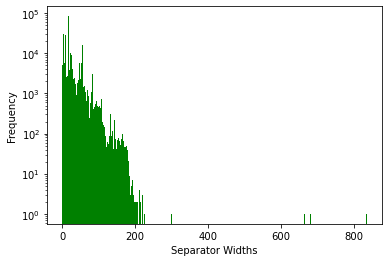

In [15]:
plt.bar(width_freqs.keys(), width_freqs.values(), color='g', log=True, width=1.0)
plt.ylabel('Frequency')
plt.xlabel('Separator Widths');
plt.savefig("sepfreqs_l.png")

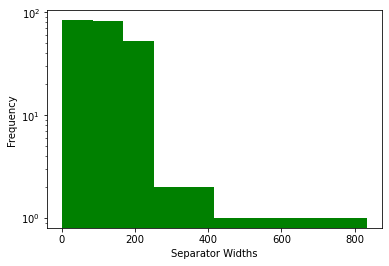

In [27]:
plt.hist(width_freqs.keys(), color='g', log=True)
plt.ylabel('Frequency')
plt.xlabel('Separator Widths');
plt.show()

In [5]:
# most common separator widths
max_widths = dict(Counter(width_freqs).most_common(10)).keys()
for key in width_freqs.keys():
    if key in max_widths:
        print(key, width_freqs[key])
# 18 - 22

10 29447
4 30464
18 83634
17 50074
56 16064
46 39801
22 40021
32 21633
9 29055
5 23768


### Word Frequencies

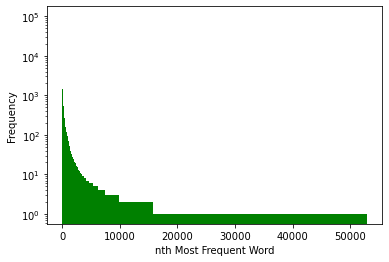

In [16]:
word_freqs_lst = [(key, word_freqs[key]) for key in word_freqs.keys()]
word_freqs_lst.sort(key=lambda x:x[1], reverse=True)
plt.bar([i for i in range(len(word_freqs_lst))], height=[elem[1] for elem in word_freqs_lst], color='g', log=True, width=1.0)
plt.ylabel('Frequency')
plt.xlabel('nth Most Frequent Word');
plt.savefig("wordfreqs_l.png")

In [ ]:
keys = list(word_freqs.keys())
# get values in the same order as keys, and parse percentage values
vals = [word_freqs[k] for k in keys]
bar_plot = barplot(x=keys, y=vals)
bar_plot.savefig('word_freqs_seaborn.png')

In [43]:
# num unique words
len(word_freqs)

52830

In [42]:
word_freqs_lst

[('000000000000000000000000000000000000000000000000001111111111111111111111111111111111111111111111111111111111111111111111111110000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000111111111111111111111111111111111111111111111111111111111111111111111111111000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000011111111111111111111111111111111111111111111111111111111111111111111111111100000000000000000000000000000000000000000000000000',
  100073),
 ('00000000000000000000000000000000000000000000000000111000000000000000111000000000000000111111111111111111111111111111111111111111111111111111111111111111111111100000000000000000000000000000000000000000000000000000000000000000011100000000000000011100000000000000011111111111111111111111111111111111111111111111111111111111111111111111110000000000000000000000000000000000000000000000000000000000000000001110000000000000001110000000000000001111111111111111111

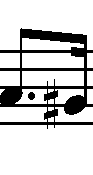

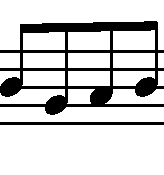

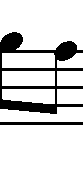

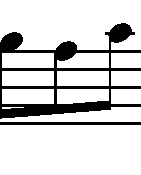

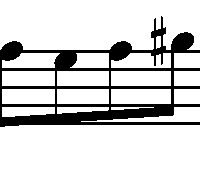

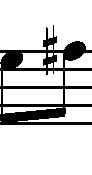

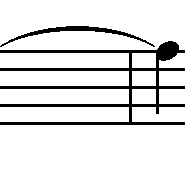

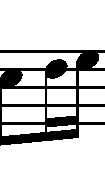

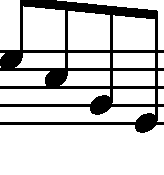

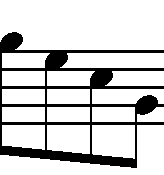

In [23]:
# most frequent words
for i in range(1, 11):
    img = wordToImg(word_freqs_lst[-i][0])
#     img.save(f'/home/ibukey/primus/common_words/{i}.png')
#     img.save(f'/home/ibukey/primus/least_common_words/{i}.png')